In [1]:
from utils import *

# Complex Form

In [2]:
# from matplotlib.colors import from_levels_and_colors
# from matplotlib.collections import LineCollection

# x = np.linspace(0, 3 * np.pi, 500)
# y = np.sin(x)
# dydx = np.cos(0.5 * (x[:-1] + x[1:]))  # first derivative

# Create a set of line segments so that we can color them individually
# This creates the points as a N x 1 x 2 array so that we can stack points
# together easily to get the segments. The segments array for line collection
# needs to be (numlines) x (points per line) x 2 (for x and y)
# points = np.array([x, y]).T.reshape(-1, 1, 2)
# segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Create a continuous norm to map from data points to colors
# norm = plt.Normalize(dydx.min(), dydx.max())
# lc = LineCollection(segments, cmap='viridis', norm=norm)
# Set the values used for colormapping
# lc.set_array(dydx)
# lc.set_linewidth(2)
# line = axs[0].add_collection(lc)
# fig.colorbar(line, ax=axs[0])

# phi = np.linspace(0, np.pi, 20)
# theta = np.linspace(0, 2 * np.pi, 40)
# x = np.outer(np.sin(theta), np.cos(phi))
# y = np.outer(np.sin(theta), np.sin(phi))
# z = np.outer(np.cos(theta), np.ones_like(phi))
# ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='w', alpha=0.3, linewidth=0)

X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
X,Y,Z

(array([[-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75],
        [-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75],
        [-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75],
        ...,
        [-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75],
        [-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75],
        [-5.  , -4.75, -4.5 , ...,  4.25,  4.5 ,  4.75]]),
 array([[-5.  , -5.  , -5.  , ..., -5.  , -5.  , -5.  ],
        [-4.75, -4.75, -4.75, ..., -4.75, -4.75, -4.75],
        [-4.5 , -4.5 , -4.5 , ..., -4.5 , -4.5 , -4.5 ],
        ...,
        [ 4.25,  4.25,  4.25, ...,  4.25,  4.25,  4.25],
        [ 4.5 ,  4.5 ,  4.5 , ...,  4.5 ,  4.5 ,  4.5 ],
        [ 4.75,  4.75,  4.75, ...,  4.75,  4.75,  4.75]]),
 array([[ 0.70886129,  0.57562789,  0.42921793, ...,  0.27541086,
          0.42921793,  0.57562789],
        [ 0.57562789,  0.4208019 ,  0.2570234 , ...,  0.09046523,
          0.2570234 ,  0.4208019 ],
        [ 0.42921793,  0.2570234 ,  0.08068791, ..., -0.09334004,
          0.0806

[0.9486832980505138, 0.31622776601683794j]


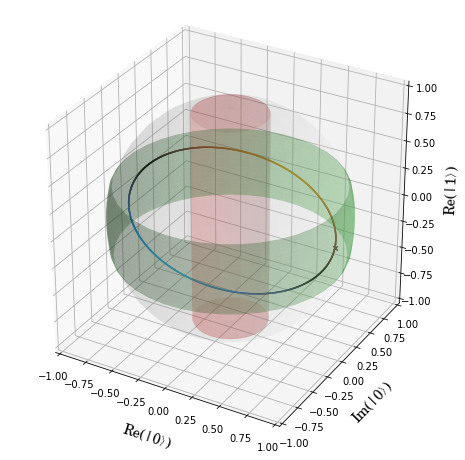

In [3]:
# %matplotlib widget
%matplotlib inline

trange = np.arange(0, 2*np.pi, step=0.01)
N = len(trange)
r = np.random.uniform(np.sqrt(0.9),1)
delta = randang()
phi = randang()

init_state = [r * np.exp(1j*delta), np.sqrt(1-r**2) * np.exp(1j*phi)]
init_state = [np.sqrt(0.9), 1j*np.sqrt(0.1)]

z_vec, o_vec = get_states(trange, init_state, had_ham)

xs = np.array([z.real for z in z_vec])
ys = np.array([z.imag for z in z_vec])
zs = np.array([z.real for z in o_vec])
cs = np.array([z.imag for z in o_vec])

cmap=mpl.cm.get_cmap('cmr.iceburn', N)

def plt_regions(ax):
    phi = np.linspace(-np.pi/2, np.pi/2, 20)
    theta = np.linspace(0, 2 * np.pi, 40)
    
    x_b = np.cos(theta)
    y_b = np.sin(theta)
    a_t = np.cos(phi)

    x = np.array([[b * a for a in a_t]for b in x_b])
    y = np.array([[b * a for a in a_t]for b in y_b])
    z = np.array([list(np.sin(phi))] * len(x))
    
    ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='w', alpha=0.1, linewidth=0)
    
    # Plots init surface
    x_b = np.cos(theta)
    y_b = np.sin(theta)
    a_t = np.sqrt(0.9) + (1 - np.sqrt(0.9)) * np.cos(phi)

    x = np.array([[b * a for a in a_t]for b in x_b])
    y = np.array([[b * a for a in a_t]for b in y_b])
    z = np.array([list(np.sqrt(0.1) * np.sin(phi))] * len(x))

    ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='g', alpha=0.3, linewidth=0)

    # Plot unsafe region
    # Cylinder
    slices = 20
    x_b = np.sqrt(0.1) *  np.cos(theta)
    x = [x_b]
    y_b = np.sqrt(0.1) * np.sin(theta)
    y = [y_b]
    z_b = np.array([np.linspace(-np.sqrt(0.9), np.sqrt(0.9),20)])
    z = [z_b]

    for i in range(slices - 1):
        x = np.concatenate((x, [x_b]))
        y = np.concatenate((y, [y_b]))
    for i in range(len(theta)-1):
        z = np.concatenate((z, [z_b]))
    z = z.reshape(len(theta),-1).T

    ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='r', alpha=0.1, linewidth=0)

    # Cone Caps
    phi = np.linspace(0, np.pi, 20)
    x_b = np.cos(theta)
    y_b = np.sin(theta)
    a_t = np.sqrt(0.1) * np.cos(phi)

    x = np.array([[b * a for a in a_t]for b in x_b])
    y = np.array([[b * a for a in a_t]for b in y_b])
    z = np.array([[np.sqrt(0.9) + (1-np.sqrt(0.9))*np.sin(p) for p in phi]])
    ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='r', alpha=0.1, linewidth=0)

    z = np.array([[-np.sqrt(0.9) - (1-np.sqrt(0.9))*np.sin(p) for p in phi]])
    ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='r', alpha=0.1, linewidth=0)

    
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111,projection='3d',box_aspect=(1,1,1))

plt_regions(ax)
    
# Plot initial state
print(init_state)
ax.scatter(xs[0], ys[0], zs[0], color=cmap(.5 + .5 * cs[0]), marker='x')

# Plot system evolution with color
for i in range(N):
    p = ax.plot(xs[i:i+2], ys[i:i+2], zs[i:i+2], color=cmap(.5 + .5 * cs[i]))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(-1,1))

prop = mpl.font_manager.FontProperties()
prop.set_file('/usr/share/fonts/truetype/tibetan-machine/TibetanMachineUni.ttf')
prop.set_size(14)

ax.set_xlabel(u'Re(|0〉)', fontproperties=prop, rotation=0, labelpad=10)
ax.set_ylabel(u'Im(|0〉)', fontproperties=prop, rotation=0, labelpad=10)
ax.set_zlabel(u'Re(|1〉)', fontproperties=prop, rotation=0, labelpad=10)
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.set_zlim(-1,1)

# fig.colorbar(sm)

# save('normal_ang.png')

# ax.set_yticks([])
# ax.set_ylabel('')
# ax.azim = -90
# ax.elev = 0
# save('side_ang.png')

# ax.set_zticks([])
# ax.set_zlabel('')
# ax.azim = -90
# ax.elev = 90
# save('above_ang.png')

plt.show()

plt.close()

In [4]:
%matplotlib inline


trange = np.arange(0, 2*np.pi, step=0.1)
N = len(trange)
r = np.random.uniform(np.sqrt(0.9),1)
delta = randang()
phi = randang()
init_state = [r * np.exp(1j*delta), np.sqrt(1-r**2) * np.exp(1j*phi)]
z_vec, o_vec = get_states(trange, init_state, had_ham)

xs = np.array([z.real for z in z_vec])
ys = np.array([z.imag for z in z_vec])
zs = np.array([z.real for z in o_vec])
cs = np.array([z.imag for z in o_vec])

dataSet = np.array([xs,ys,zs,cs])
ts = trange

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111,projection='3d',box_aspect=(1,1,1))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(-1,1))
fig.colorbar(sm)

def animate_func(num):
    ax.clear()
    
    c = cmap(.5 + .5 * dataSet[3][num])
             
    # Plots trajectory line
    for i in range(num):
         p = ax.plot(xs[i:i+2], ys[i:i+2], zs[i:i+2], color=cmap(.5 + .5 * dataSet[3][i]))

    # Updating Point Location
    ax.scatter(dataSet[0, num], dataSet[1, num], dataSet[2, num], 
               color=c, marker='o', s=100)
    
    # Add start point
    origin = str((dataSet[0, 0], dataSet[1, 0], dataSet[2, 0]))
    ax.plot3D(dataSet[0, 0], dataSet[1, 0], dataSet[2, 0],
              c='black', marker='o', label=origin)
    
    # Plot safe and unsafe regions
    plt_regions(ax)

    # Setting Axes Limits
    ax.set_xlim3d([-1, 1])
    ax.set_ylim3d([-1, 1])
    ax.set_zlim3d([-1, 1])

    # Adding Figure
    ax.set_title('Complex Evolution\nTime = ' + str(np.round(ts[num],    
                 decimals=2)) + ' sec')
    ax.set_xlabel('Re(|0>)')
    ax.set_ylabel('Im(|0>)')
    ax.set_zlabel('Re(|1>)')


# Plotting the Animation
line_ani = animation.FuncAnimation(fig, animate_func, interval=100,   
                                   frames=N)

anim = HTML(line_ani.to_jshtml())
plt.close(fig)
anim

In [5]:
def plot_implicit(ax, fn, bbox=(-2.5,2.5)):
    ''' create a plot of an implicit function
    fn  ...implicit function (plot where fn==0)
    bbox ..the x,y,and z limits of plotted interval'''
    xmin, xmax, ymin, ymax, zmin, zmax = bbox*3
    A = np.linspace(xmin, xmax, 100) # resolution of the contour
    B = np.linspace(xmin, xmax, 15) # number of slices
    A1,A2 = np.meshgrid(A,A) # grid on which the contour is plotted

    for z in B: # plot contours in the XY plane
        X,Y = A1,A2
        Z = fn(X,Y,z)
        cset = ax.contour(X, Y, Z+z, [z], zdir='z')
        # [z] defines the only level to plot for this contour for this value of z

    for y in B: # plot contours in the XZ plane
        X,Z = A1,A2
        Y = fn(X,y,Z)
        cset = ax.contour(X, Y+y, Z, [y], zdir='y')

    for x in B: # plot contours in the YZ plane
        Y,Z = A1,A2
        X = fn(x,Y,Z)
        cset = ax.contour(X+x, Y, Z, [x], zdir='x')

/tmp/ipykernel_7354/2831435865.py:7: RuntimeWarning: invalid value encountered in sqrt
  b = z + 1j*np.sqrt(1 - (x**2 + y**2 + z**2))
/home/campus.ncl.ac.uk/c0077946/anaconda3/envs/dreal/lib/python3.9/site-packages/numpy/ma/core.py:2826: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,
/home/campus.ncl.ac.uk/c0077946/anaconda3/envs/dreal/lib/python3.9/site-packages/matplotlib/contour.py:1491: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/home/campus.ncl.ac.uk/c0077946/anaconda3/envs/dreal/lib/python3.9/site-packages/matplotlib/contour.py:1492: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/tmp/ipykernel_7354/3411603034.py:13: UserWarning: No contour levels were found within the data range.
  cset = ax.contour(X, Y, Z+z, [z], zdir='z')
/home/campus.ncl.ac.uk/c0077946/anaconda3/envs/dreal/lib/python3.9/site-packages/matplotlib/cbook

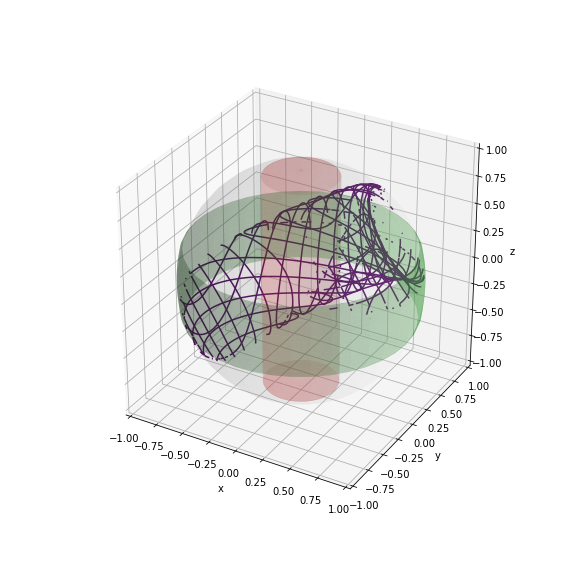

In [6]:
%matplotlib widget
# %matplotlib inline

B = lambda a, b: 6/5 - a * np.conj(a) - np.conj(a) * b - np.conj(b) * a
def Bp(x,y,z):
    a = x + 1j*y
    b = z + 1j*np.sqrt(1 - (x**2 + y**2 + z**2))
    return B(a,b)


X = np.arange(-1, 1, 0.1)
# Complex plane
X,Y = np.meshgrid(X,X)
Y = Y * 1j

Z0, Z1 = np.meshgrid(X+Y, X+Y)

Z = B(Z0, Z1)

X = Z0.real
Y = Z0.imag
# Z = Z1.real

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111,projection='3d',box_aspect=(1,1,1))

# ax.contour3D(X,Y,Z, 
#              levels=[0]
#             )

plot_implicit(ax, Bp,bbox=(-1,1))

plt_regions(ax)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.set_zlim(-1,1)

# ax.set_zticks([])
# ax.set_zlabel('')
# ax.azim = -90
# ax.elev = 90

plt.show()